## Part 0 - Coming back from a restart...


In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

from fastai.vision import *
from fastai.metrics import error_rate
from fastai.callbacks import SaveModelCallback

# Importações para Utilitários Diversos
from shutil import copyfile
import matplotlib.pyplot as plt
import operator
from PIL import Image
from sys import intern   # For the symbol definitions

size = 448

path = Path("/content/gdrive/My Drive/University/TCC/data_iter3");

tfms = get_transforms(do_flip=False, flip_vert=False, max_rotate=None, 
                      max_warp=None, max_lighting=None, max_zoom=1.0)
# diga quantas transformações foram criadas
print(len(tfms))
# Crie um data bunch com as transformações, size e bs
# POR ENQUANTO SEM DATA AUGMENTATION: ds_tfms=None
data = (ImageList.from_csv(path, 'labels.csv', folder='train', suffix='.jpg')
        .split_from_df(col='valid')
        .label_from_df(label_cls=FloatList)
        .transform(tfms, size=size)
        .databunch()
       )

# If using ResNet34 or lower:
# data.batch_size = 64

# If using ResNet50:
data.batch_size = 32

# If using ResNet101:
# data.batch_size = 16

# Diga o que criou
data

2


ImageDataBunch;

Train: LabelList (2509 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.17,0.0,0.0,0.0,0.0
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (630 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.5,0.0,0.33,0.67,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: None

##Part 1 - Initializations 

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

###Para testar se o seu Jupyter Notebook está rodando com GPU de fato....

Alguns toques que estão aqui vem de Hiromi Suenaga: https://medium.com/@hiromi_suenaga/deep-learning-2-part-1-lesson-1-602f73869197

You should get **'/device:GPU:0'** if notebook is connected to GPU otherwise you will get **' '**

In [0]:
# Checar a versão de Python (tem de ser pelo menos 3.5)
import sys
sys.version

# Checar se tensorFlow roda e a GPU está ativa...
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

####Testando e analisando a sua máquina virtual no Google Colab...

*Se* você teve problemas: Veja qual a versão do driver, qual placa e qual versão de CUDA estão disponíveis...

In [0]:
!/opt/bin/nvidia-smi
!nvcc --version

Mon Apr  1 02:06:05 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 410.79       Driver Version: 410.79       CUDA Version: 10.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    57W / 149W |    121MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

Se você teve problemas: Veja qual a versão do sistema operacional e qual a arquitetura da máquina:

In [0]:
!uname -a
!cat /etc/lsb-release

Linux 7a944265c5da 4.14.79+ #1 SMP Wed Dec 19 21:19:13 PST 2018 x86_64 x86_64 x86_64 GNU/Linux
DISTRIB_ID=Ubuntu
DISTRIB_RELEASE=18.04
DISTRIB_CODENAME=bionic
DISTRIB_DESCRIPTION="Ubuntu 18.04.1 LTS"


###Opção de montar seu Google Drive como disco virtual

Observe que para funcionar, você de ter os dados no *drive associado a esta conta com a qual você está rodando este Notebook* em exatamente o local indicado em *base_dir*. Modifique este código para refletir a estrutura do seu Google Drive. A única coisa que sempre é igual é a pasta* /content/drive* que sempre será a pasta onde o Collab vai montar a raiz do disco virtual do seu Drive. 

In [0]:
import os

# Codigo para montar o Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


...agora liste o conteúdo do *drive*....

In [0]:
!ls "/content/gdrive/My Drive"

'Colab Notebooks'		     lecture29.ppt   schedule.gsheet
 Games				    'Light Novel'    University
'intro to research reporting.pptx'   Mom	     UpdraftPlus


...se você fez tudo direitinho, os seus dados vão estar em uma subpasta de */content/gdrive/My Drive/*...

Liste o conteúdo desta pasta:

In [0]:
!ls "/content/gdrive/My Drive/University/TCC/data_iter3"

labels.csv  mobile50-fit-best.pth  models  train


....vamos ver se dá para ler os dados do dataset...

In [0]:
!ls "/content/gdrive/My Drive/University/TCC/data_iter3/train"

0001_app-inventor.jpg		1525_rico.jpg  2989_rico.jpg
0002_app-inventor.jpg		1526_rico.jpg  2990_rico.jpg
0003_app-inventor.jpg		1527_rico.jpg  2991_rico.jpg
0005_app-inventor.jpg		1529_rico.jpg  2993_rico.jpg
0006_app-inventor.jpg		1531_rico.jpg  2994_rico.jpg
0007_app-inventor.jpg		1532_rico.jpg  2996_rico.jpg
0008_app-inventor.jpg		1536_rico.jpg  2997_rico.jpg
0009_app-inventor.jpg		1538_rico.jpg  2999_rico.jpg
0013_app-inventor.jpg		1539_rico.jpg  3000_rico.jpg
0014_app-inventor.jpg		1540_rico.jpg  3003_rico.jpg
0015_app-inventor_our-apps.jpg	1541_rico.jpg  3006_rico.jpg
0016_app-inventor.jpg		1544_rico.jpg  3007_rico.jpg
0017_app-inventor.jpg		1545_rico.jpg  3008_rico.jpg
0019_app-inventor.jpg		1547_rico.jpg  3009_rico.jpg
0021_app-inventor.jpg		1548_rico.jpg  3010_rico.jpg
0022_app-inventor.jpg		1551_rico.jpg  3012_rico.jpg
0024_app-inventor.jpg		1552_rico.jpg  3013_rico.jpg
0025_app-inventor.jpg		1554_rico.jpg  3014_rico.jpg
0026_app-inventor.jpg		1555_rico.jpg  3015_rico.jpg
0027

###Library imports

*We* import all the necessary packages. We are going to work with the [fastai V1 library](http://www.fast.ai/2018/10/02/fastai-ai/) which sits on top of [Pytorch 1.0](https://hackernoon.com/pytorch-1-0-468332ba5163). The fastai library provides many useful functions that enable us to quickly and easily build neural networks and train our models.

In [0]:
from fastai.vision import *
from fastai.metrics import error_rate
from fastai.callbacks import SaveModelCallback

# Importações para Utilitários Diversos
from shutil import copyfile
import matplotlib.pyplot as plt
import operator
from PIL import Image
from sys import intern   # For the symbol definitions

size = 448

## Looking at the data

We are going to use the Mobile Interfaces  Data collected at GQS/UFSC...

...crie uma instância de PosixPath...

In [0]:
path = Path("/content/gdrive/My Drive/University/TCC/data_iter3");
path
path.ls()
#pd.read_csv(path/"labels.csv")

[PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/models'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/export.pkl'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/bland_altman_with_negative_vals.csv'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/bland_altman.csv'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/labels.csv')]

###Gerando o conjunto de dados para treinar e testar a rede

Criamos uma ImageList a partir do arquivo csv e do dataset.

**split_by_rand_pct()** utiliza 80/20 por default

**label_cls=FloatList** indica ao fastai que estamos trabalhando com regressão

A aumentação de dados deixamos padrão, com escalonamentos, rotações e flips verticais, indicando apenas **get_transforms()** sem parâmetros.

Como não terá aumentação de dados, para forçar pegar a uma imgem toda e colocar na resolução da rede sem cortar nada fora, você tem de usar SQUISH: https://docs.fast.ai/vision.transform.html#_squish  dentro do ImageDataBunch.from... : *resize_method=ResizeMethod.SQUISH*

**databunch()** transforma o resultado em um databunch


In [0]:
# Para achar duplicatas - olha todas as pastas em "/content/gdrive/My Drive/University/TCC/data_iter3/"
!find "/content/gdrive/My Drive/University/TCC/data/" -printf "%p %f\n" | sort -f -k2 | uniq -Di -f1
# Se houver duplicatas, vai mostrar abaixo

find: ‘/content/gdrive/My Drive/University/TCC/data/’: No such file or directory


In [0]:
tfms = get_transforms(do_flip=False, flip_vert=False, max_rotate=None, 
                      max_warp=None, max_lighting=None, max_zoom=1.0)
# diga quantas transformações foram criadas
print(len(tfms))
# Crie um data bunch com as transformações, size e bs
# POR ENQUANTO SEM DATA AUGMENTATION: ds_tfms=None
data = (ImageList.from_csv(path, 'labels.csv', folder='train', suffix='.jpg')
        .split_from_df(col='valid')
        .label_from_df(label_cls=FloatList)
        .transform(tfms, size=size)
        .databunch()
       )

# If using ResNet34 or lower:
# data.batch_size = 64

# If using ResNet50:
# data.batch_size = 32

# If using ResNet101:
data.batch_size = 16

# Diga o que criou
data

2


ImageDataBunch;

Train: LabelList (2509 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.17,0.0,0.0,0.0,0.0
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (630 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.5,0.0,0.33,0.67,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: None

In [0]:
def get_ex(): return open_image('/content/gdrive/My Drive/University/TCC/data_iter3/train/1389_rico.jpg')

def plots_f(rows, cols, width, height, **kwargs):
    [get_ex().apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(
        rows,cols,figsize=(width,height))[1].flatten())]

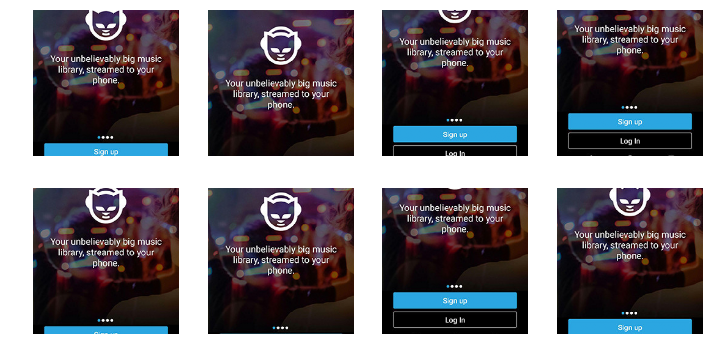

In [0]:
# CASO TIVESSE USADO DATA AUGMENTATION MÍNIMO:
plots_f(2, 4, 12, 6, size=size)

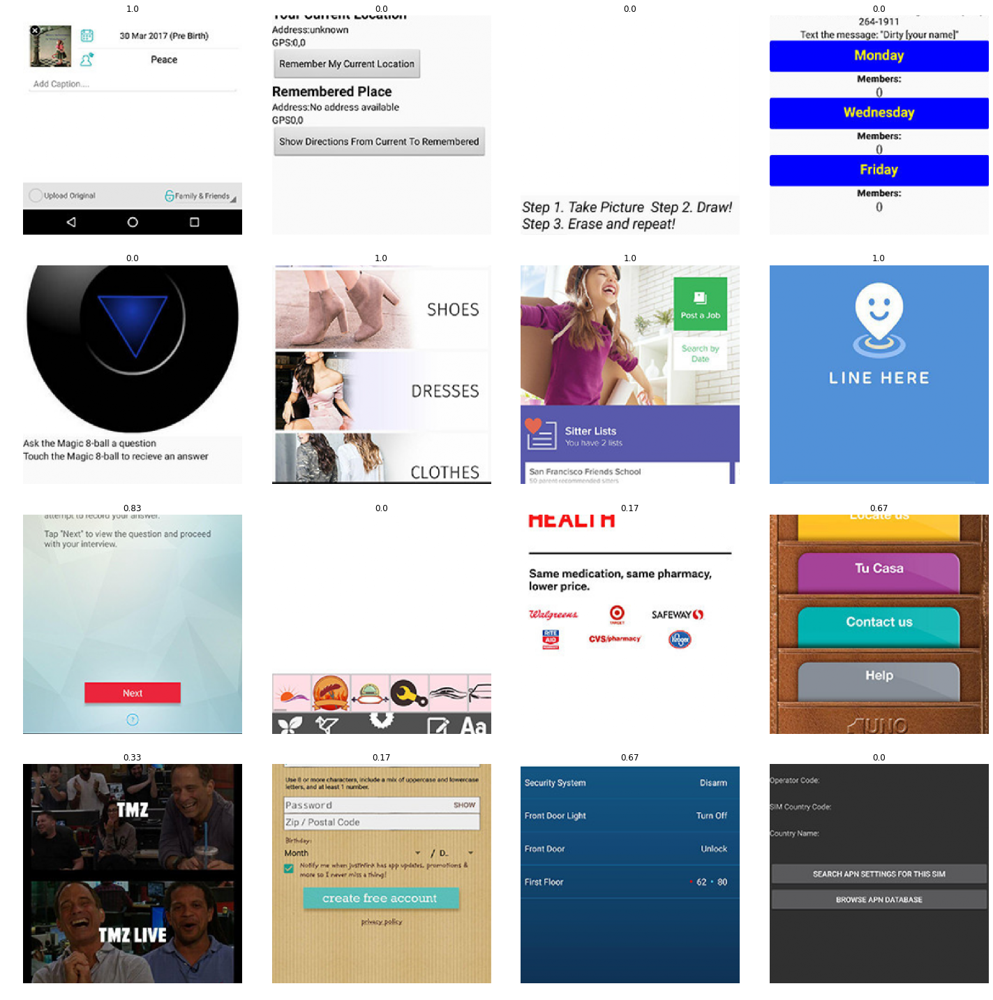

In [0]:
data.show_batch(rows=4, figsize=(20,20))

**JUMP TO PART 2, 3 OR 4**

# Part 2

Now we will start training our model. We will use a [convolutional neural network](http://cs231n.github.io/convolutional-networks/) backbone and a fully connected head with a single hidden layer as a classifier. Don't know what these things mean? Not to worry, we will dive deeper in the coming lessons. For the moment you need to know that we are building a model which will take images as input and will output the predicted probability for each of the categories (in this case, it will have 37 outputs).


## ResNet34

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=[mean_squared_error])
learn.loss = MSELossFlat

Mostre a arquitetura:

In [0]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

## Training

#### fit

In [0]:
learn.fit(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model34-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.925020,0.215329,0.215329,12:24
1,0.453952,0.099472,0.099472,00:59
2,0.268490,0.087134,0.087134,00:58
3,0.181360,0.085280,0.085280,00:58
4,0.135009,0.086936,0.086936,00:58
5,0.112165,0.081108,0.081108,00:59
6,0.101601,0.085261,0.085261,00:58
7,0.094095,0.078778,0.078778,00:58
8,0.090440,0.083231,0.083231,00:58
9,0.088615,0.083030,0.083030,00:58


##### fine-tuning

In [0]:
learn.load(path/'models/model34-fit-best')
learn.unfreeze()
learn.fit(15, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model34-fit-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.119321,0.132260,0.132260,01:02
1,0.103981,0.101822,0.101822,01:01
2,0.092527,0.103140,0.103140,01:00
3,0.083776,0.088400,0.088400,01:00
4,0.076877,0.089388,0.089388,01:00
5,0.070084,0.094486,0.094486,00:59
6,0.062772,0.095199,0.095199,00:59
7,0.057694,0.093279,0.093279,00:59
8,0.054173,0.105628,0.105628,00:59
9,0.050639,0.090095,0.090095,00:59


#### fit_one_cycle

**Estratégias**: 
- método *fit1cycle* de Leslie N. Smith  - veja aqui para detalhes: 

  - https://docs.fast.ai/callbacks.one_cycle.html

  - A disciplined approach to neural network hyper-parameters: Part 1 -- learning rate, batch size, momentum, and weight decay - https://arxiv.org/abs/1803.09820
    
  - Super-Convergence: Very Fast Training of Residual Networks Using Large Learning Rates - https://arxiv.org/abs/1708.07120

- salvamento a cada época, desde que melhore a acurácia: https://docs.fast.ai/callbacks.html#SaveModelCallback


In [0]:
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model34-1cycle-best')])
# learn.save('mobile-stage-1')
# Salve também no Google Drive...
# learn.save('/content/gdrive/My Drive/University/TCC/data_iter3/mobile-stage-1')

epoch,train_loss,valid_loss,mean_squared_error,time
0,1.346200,0.345817,0.345817,00:55
1,0.964238,0.287325,0.287325,00:55
2,0.653745,0.138574,0.138574,00:55
3,0.406623,0.097395,0.097395,00:55
4,0.258767,0.084015,0.084015,00:55
5,0.178251,0.079108,0.079108,00:55
6,0.132694,0.079129,0.079129,00:55
7,0.107215,0.077635,0.077635,00:55
8,0.093777,0.076452,0.076452,00:55
9,0.088713,0.076611,0.076611,00:55


##### fine-tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 7.59E-07
Min loss divided by 10: 9.12E-08


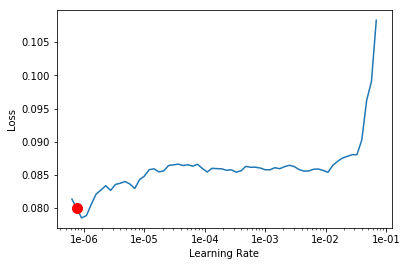

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=[mean_squared_error])
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model34-1cycle-best')
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=[mean_squared_error])
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model34-1cycle-best')
learn.unfreeze()

In [0]:
learn.fit_one_cycle(15, max_lr=slice(6e-07, 9e-07),callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model34-1cycle-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.083276,0.066707,0.066707,01:02
1,0.079654,0.066410,0.066410,01:02
2,0.080907,0.065933,0.065933,01:02
3,0.084563,0.066232,0.066232,01:01
4,0.085267,0.065981,0.065981,01:00
5,0.083878,0.065629,0.065629,01:00
6,0.082514,0.065603,0.065603,01:00
7,0.082891,0.065101,0.065101,00:59
8,0.082275,0.065344,0.065344,01:00
9,0.081170,0.065458,0.065458,00:59


## Results

Let's see what results we have got. 

We will first see which were the categories that the model most confused with one another. We will try to see if what the model predicted was reasonable or not. In this case the mistakes look reasonable (none of the mistakes seems obviously naive). This is an indicator that our classifier is working correctly. 

Furthermore, when we plot the confusion matrix, we can see that the distribution is heavily skewed: the model makes the same mistakes over and over again but it rarely confuses other categories. This suggests that it just finds it difficult to distinguish some specific categories between each other; this is normal behaviour.

#### fit

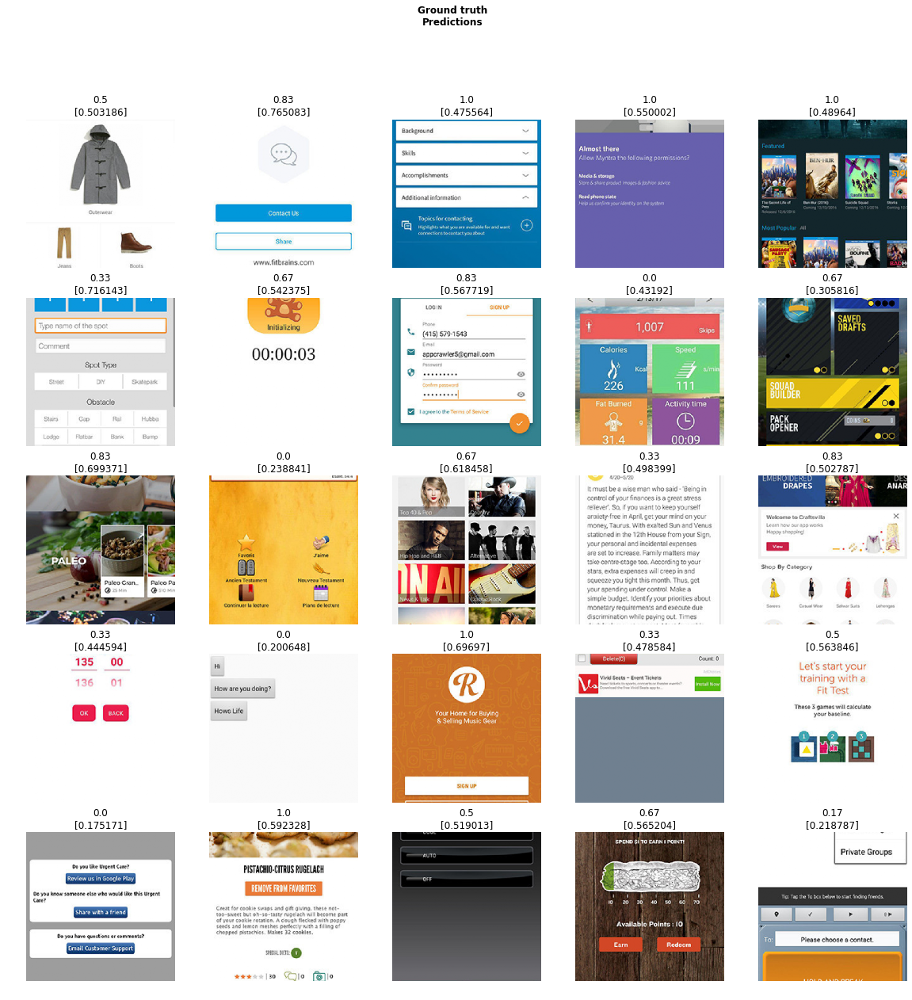

In [0]:
learn.show_results()

#### fit_one_cycle

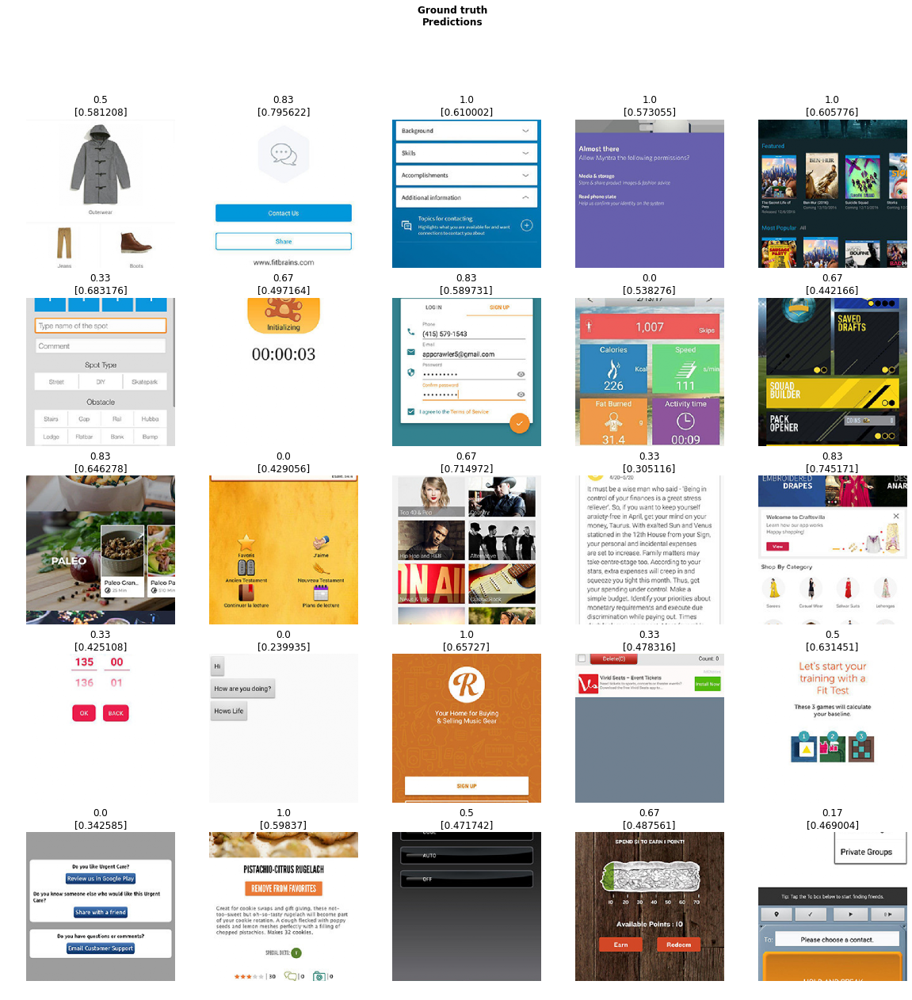

In [0]:
learn.show_results()

#Part 3 - Usando redes menos poderosas...

## 3.1 - ResNet18

In [0]:
learn = cnn_learner(data, models.resnet18, metrics=mean_squared_error)
learn.loss = MSELossFlat

In [0]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

### Training

#### fit

In [0]:
learn.fit(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model18-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.893219,0.189643,0.189643,00:54
1,0.445039,0.097660,0.097660,00:54
2,0.262859,0.084311,0.084311,00:54
3,0.178290,0.081475,0.081475,00:54
4,0.134558,0.080374,0.080374,00:54
5,0.113917,0.079719,0.079719,00:54
6,0.102972,0.078926,0.078926,00:54
7,0.097902,0.079204,0.079204,00:54
8,0.093224,0.085368,0.085368,00:54
9,0.091868,0.082390,0.082390,00:54


#### fit_one_cycle

In [0]:
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model18-1cycle-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,1.439899,0.342722,0.342722,00:55
1,1.048183,0.295859,0.295859,00:56
2,0.725826,0.157778,0.157778,00:56
3,0.448411,0.096934,0.096934,00:55
4,0.280317,0.086865,0.086865,00:55
5,0.189216,0.083267,0.083267,00:55
6,0.140565,0.081025,0.081025,00:55
7,0.114164,0.078895,0.078895,00:55
8,0.099188,0.077553,0.077553,00:55
9,0.090575,0.077254,0.077254,00:55


##### fine-tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 9.12E-07
Min loss divided by 10: 1.91E-05


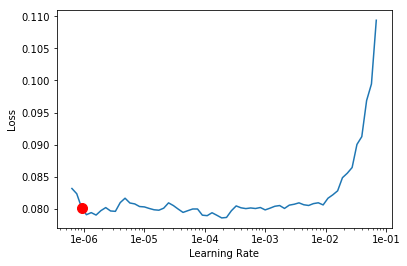

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model18-1cycle-best')
learn.unfreeze()
learn.fit_one_cycle(15, max_lr=slice(6e-07, 1e-06),callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model18-1cycle-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.079206,0.077110,0.077110,00:57
1,0.081327,0.077324,0.077324,01:00
2,0.081340,0.077000,0.077000,00:58
3,0.082313,0.076864,0.076864,00:57
4,0.083625,0.076748,0.076748,00:57
5,0.081753,0.076317,0.076317,00:56
6,0.082399,0.076546,0.076546,00:56
7,0.082884,0.076277,0.076277,00:55
8,0.082499,0.076368,0.076368,00:55
9,0.084261,0.076438,0.076438,00:54


### Results

#### fit

In [0]:
learn.show_results()

#### fit_one_cycle

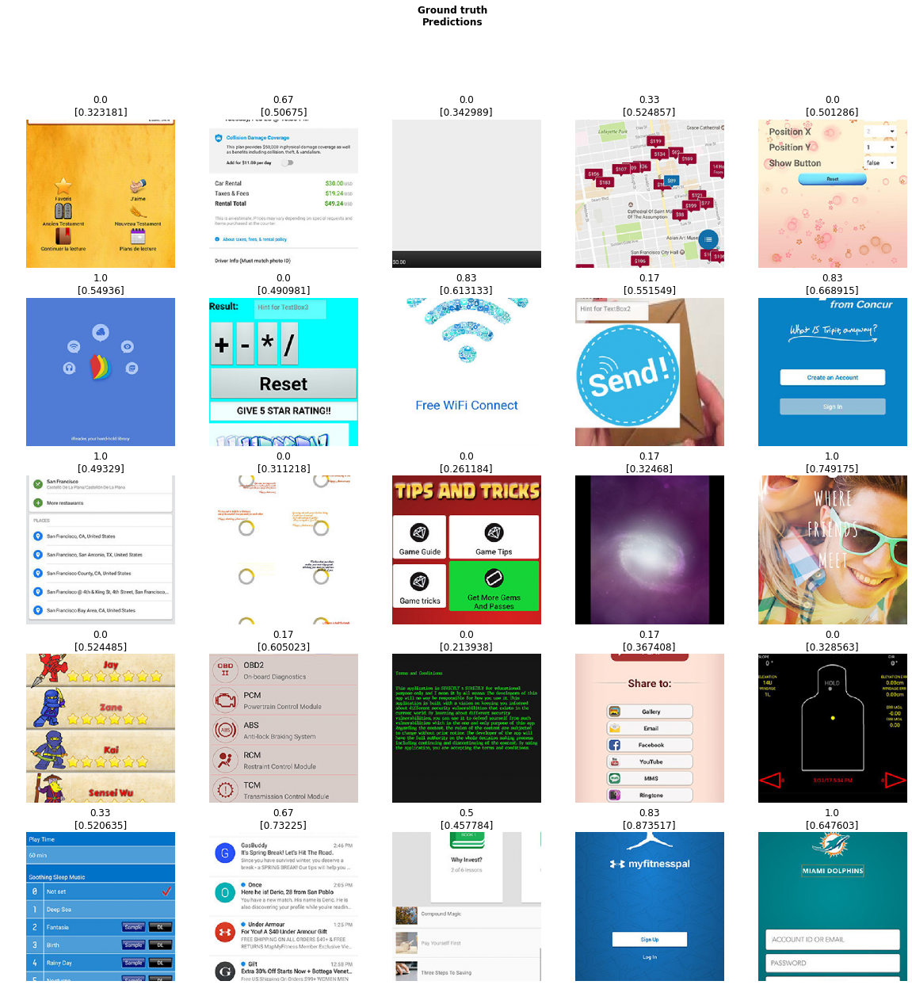

In [0]:
learn.show_results()

#Part 4 - Usando redes MAIS poderosas...

## 4.1 - ResNet50

Now we will train in the same way as in Part 2 but with one caveat: instead of using resnet34 as our backbone we will use resnet50 (resnet34 is a 34 layer residual network while resnet50 has 50 layers. It will be explained later in the course and you can learn the details in the [resnet paper](https://arxiv.org/pdf/1512.03385.pdf)).

Basically, resnet50 usually performs better because it is a deeper network with more parameters. Let's see if we can achieve a higher performance here. To help it along, let's us use larger images too, since that way the network can see more detail. We reduce the batch size a bit since otherwise this larger network will require more GPU memory.

In [0]:
learn = cnn_learner(data, models.resnet50, metrics=mean_squared_error)
learn.loss = MSELossFlat

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 83.0MB/s]


### Training
Lets train the model...

#### fit

In [0]:
learn.fit(15, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model50-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.776000,0.133441,0.133441,01:15
1,0.297462,0.097899,0.097899,01:11
2,0.159306,0.090451,0.090451,01:12
3,0.115024,0.097163,0.097163,01:11
4,0.100485,0.089916,0.089916,01:11
5,0.101297,0.116569,0.116569,01:12
6,0.097179,0.090967,0.090967,01:11
7,0.093670,0.089429,0.089429,01:11
8,0.091178,0.097367,0.097367,01:11
9,0.085425,0.088441,0.088441,01:11


#### fit_one_cycle

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.63E-05
Min loss divided by 10: 1.10E-05


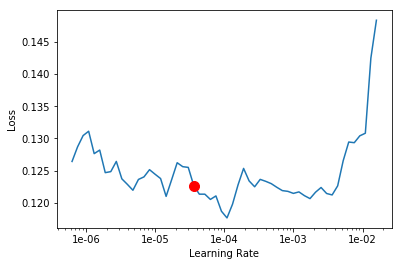

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn = cnn_learner(data, models.resnet50, metrics=mean_squared_error)
learn.loss = MSELossFlat
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model50-1cycle-best')])
#max_lr=slice(2e-04, 2e-03)
#learn50.fit_one_cycle(9)

epoch,train_loss,valid_loss,mean_squared_error,time
0,3.418445,1.218954,1.218954,02:41


KeyboardInterrupt: ignored

##### fine-tuning

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model50-1cycle-best')
learn.lr_find()
learn.recorder.plot(suggestion=True)

Learner(data=ImageDataBunch;

Train: LabelList (2509 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.17,0.0,0.0,0.0,0.0
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (630 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.5,0.0,0.33,0.67,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model50-1cycle-best')
learn.unfreeze()
#max_lr=slice(6.3e-07, 7.6e-06)
learn50.fit_one_cycle(3, max_lr=slice(1.2e-06,1.5e-06), callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model50-1cycle-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.064045,0.051369,0.051369,03:33
1,0.061142,0.051531,0.051531,03:32
2,0.058698,0.051369,0.051369,03:32


### Results


#### fit

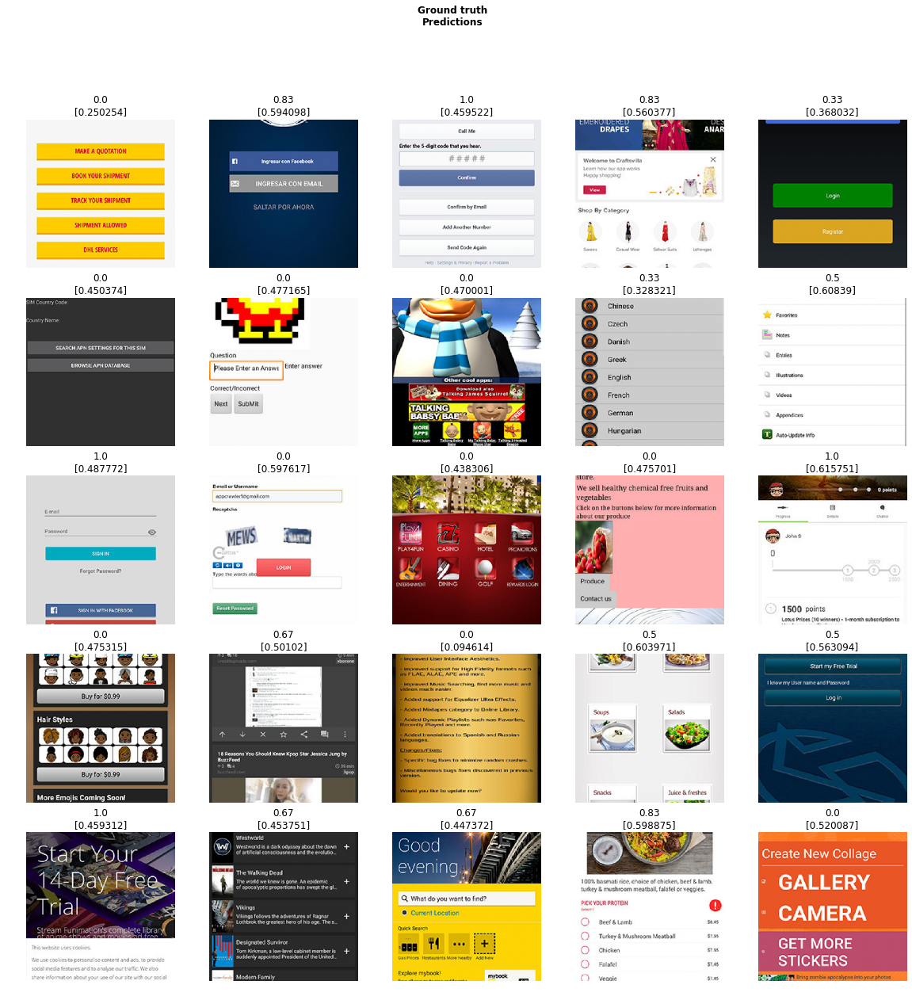

In [0]:
learn.show_results()

#### fit_one_cycle

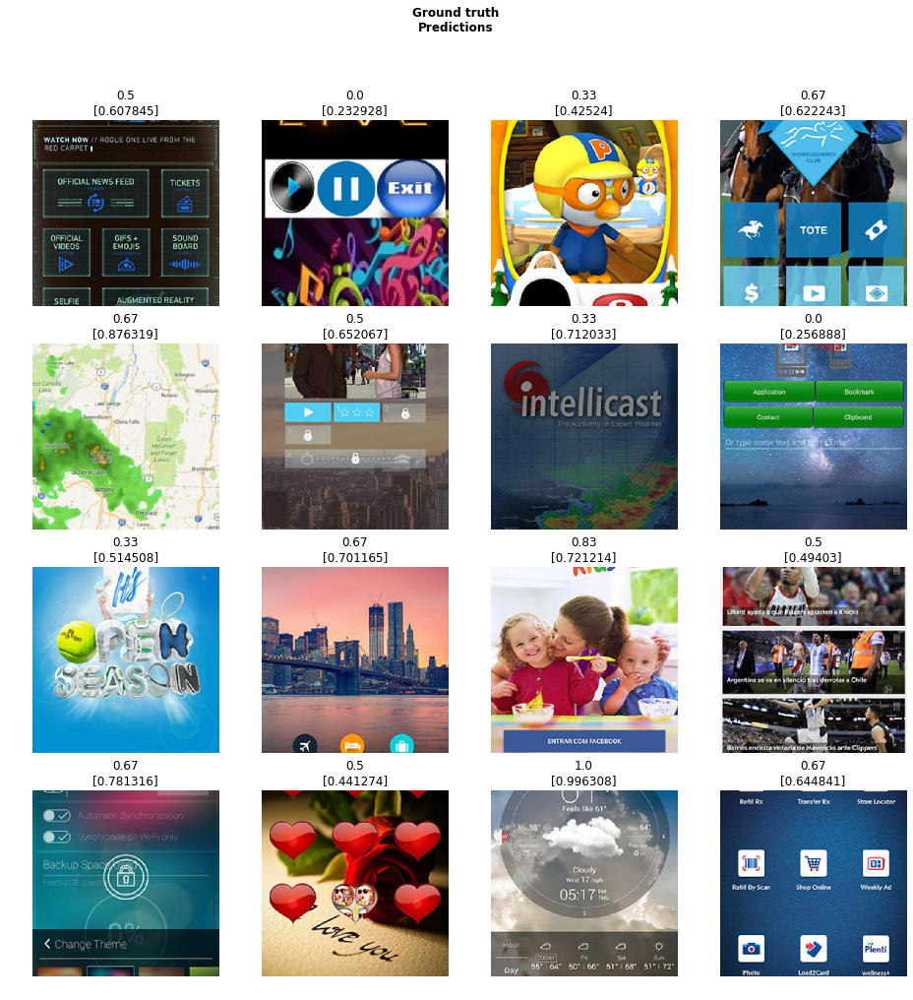

In [0]:
learn.show_results()

## 4.2 - ResNet101

In [0]:
learn = cnn_learner(data, models.resnet101, metrics=mean_squared_error)
learn.loss = MSELossFlat

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 178728960/178728960 [00:03<00:00, 49282253.34it/s]


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.91E-06
Min loss divided by 10: 6.31E-08


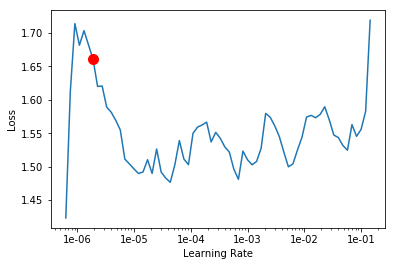

In [0]:
#learn.lr_find()
#learn.recorder.plot(suggestion=True)

### Training

#### fit

In [0]:
learn.fit(15, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model101-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.404410,0.118961,0.118961,01:55
1,0.152603,0.112314,0.112314,01:53
2,0.118820,0.093403,0.093403,01:53
3,0.116379,0.134230,0.134230,01:53
4,0.108558,0.089405,0.089405,01:53
5,0.106190,0.087822,0.087822,01:53
6,0.101191,0.102725,0.102725,01:53
7,0.089254,0.091149,0.091149,01:53
8,0.087102,0.095947,0.095947,01:52
9,0.082537,0.079100,0.079100,01:53


Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

KeyboardInterrupt: ignored

#### fit_one_cycle

In [0]:
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model101-1cycle-best')])
# max_lr=slice(1.9e-06, 3e-06)

epoch,train_loss,valid_loss,mean_squared_error,time
0,1.332157,0.723593,0.723593,01:56
1,0.577611,0.177824,0.177824,01:52
2,0.191045,0.098625,0.098625,01:52
3,0.127879,0.094304,0.094304,01:51
4,0.114545,0.100369,0.100369,01:51
5,0.106391,0.085553,0.085553,01:51
6,0.097584,0.087404,0.087404,01:51
7,0.081880,0.081756,0.081756,01:51
8,0.075732,0.079825,0.079825,01:51
9,0.069905,0.077876,0.077876,01:51


##### fine-tuning

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model101-1cycle-best')

Learner(data=ImageDataBunch;

Train: LabelList (2188 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.67,0.17,0.67,0.17,0.33
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (480 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.33,0.33,1.0,0.17,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: LabelList (471 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: EmptyLabelList
,,,,
Path: /content/gdrive/My Drive/University/TCC/data_iter3, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, s

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.91E-06
Min loss divided by 10: 3.98E-05


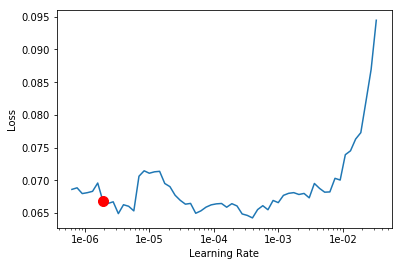

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model101-1cycle-best')
learn.unfreeze()
learn.fit_one_cycle(20, max_lr=slice(5e-07, 5e-06), callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model101-1cycle-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.073170,0.079712,0.079712,02:33
1,0.068587,0.078031,0.078031,02:30
2,0.071371,0.077333,0.077333,02:30
3,0.071356,0.076289,0.076289,02:30
4,0.070999,0.077252,0.077252,02:30
5,0.070454,0.076333,0.076333,02:30
6,0.066739,0.076788,0.076788,02:30
7,0.064794,0.077555,0.077555,02:30
8,0.063018,0.078529,0.078529,02:30
9,0.065229,0.075475,0.075475,02:30


### Results

#### fit

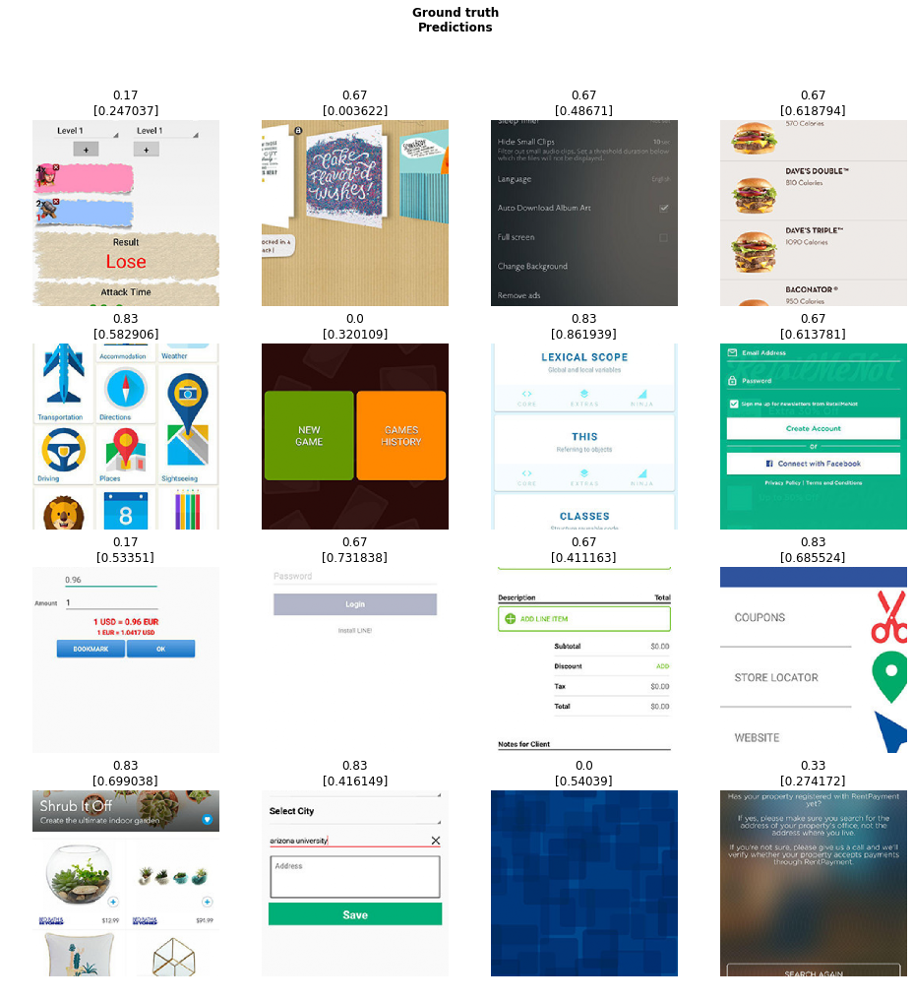

In [0]:
learn.show_results()

#### fit_one_cycle

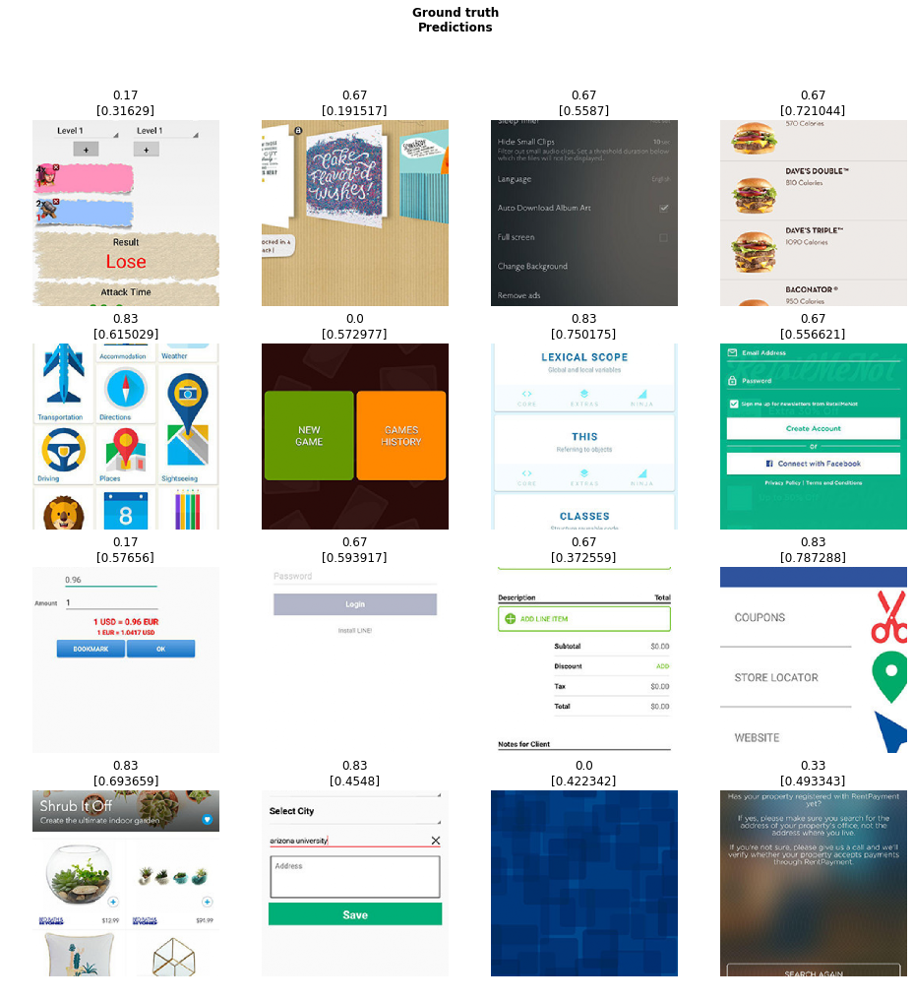

In [0]:
learn.show_results()

# Part 5 - Saved models reference

**model18-fit-best**:
*   Trained with fit(10)
*   MSE of 0.078778
*   No fine-tuning made

**model18-1cycle-best**:
*   Trained with fit_one_cycle(10)
*   MSE of 0.077254
*   No fine-tuning made

**model18-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(6e-07, 1e-06))
*   Trained with fit_one_cycle(15)
*   **MSE of 0.075770**

---


**model34-fit-best**:
*   Trained with fit(10)
*   MSE of 0.078778
*   No fine-tuning made

**model34-1cycle-best**:
*   Trained with fit_one_cycle(15)
*   MSE of 0.076452
*   No fine-tuning made

**model34-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(6.31e-07, 8e-07))
*   Trained with fit_one_cycle(15)
*   **MSE of 0.065101**


---

**model50-fit-best**:
*   Trained with fit(15)
*   MSE of 0.081291
*   No fine-tuning made

**model50-1cycle-best**:
*   Trained with fit_one_cycle(9)
*   MSE of 0.073359
*   No fine-tuning made

**model50-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(1.2e-06,1.5e-06))
*   Trained with fit_one_cycle(5)
*   MSE of 0.051867

**model50-1cycle-2ndStage-best2**:
*   Fine-tuned(unfrozen, max_lr=slice(1.2e-06,1.5e-06))
*   Trained with fit_one_cycle(5)
*   **MSE of 0.051369**


---

**model101-fit-best**:
*   Trained with fit(14)
*   MSE of 0.082701
*   No fine-tuning made

**model101-1cycle-best**:
*   Trained with fit_one_cycle(13)
*   **MSE of 0.074314**
*   No fine-tuning made

**model101-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(6.3e-07, 7.6e-06))
*   Trained with fit_one_cycle(3)
*   **MSE of 0.52089**

# Part 6 - Testing and misc.

### - Loading desired weights...

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model50-1cycle-2ndStage-best2')

Learner(data=ImageDataBunch;

Train: LabelList (2509 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.17,0.0,0.0,0.0,0.0
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (630 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.5,0.0,0.33,0.67,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-

### Exporting network

In [0]:
learn.export()

###

In [0]:
'''
img_list = (ImageList.from_csv(path, 'labels.csv', folder='train', suffix='.jpg')
            .split_by_rand_pct(1.0)
            .label_from_df(label_cls=FloatList)
            .transform(tfms, size=size)
            .databunch()
       )
'''
preds = []
for img in data.valid_ds:
  preds.append((learn.predict(img[0]), img[1]))

new_preds=[]
for item in preds:
  new_preds.append((item[0][0], item[1]))
  
new_preds

(Image (3, 448, 448), FloatItem 0.5)
(Image (3, 448, 448), FloatItem 0.0)
(Image (3, 448, 448), FloatItem 0.33)
(Image (3, 448, 448), FloatItem 0.67)
(Image (3, 448, 448), FloatItem 0.67)
(Image (3, 448, 448), FloatItem 0.5)
(Image (3, 448, 448), FloatItem 0.33)
(Image (3, 448, 448), FloatItem 0.0)
(Image (3, 448, 448), FloatItem 0.33)
(Image (3, 448, 448), FloatItem 0.67)
(Image (3, 448, 448), FloatItem 0.83)
(Image (3, 448, 448), FloatItem 0.5)
(Image (3, 448, 448), FloatItem 0.67)
(Image (3, 448, 448), FloatItem 0.5)
(Image (3, 448, 448), FloatItem 1.0)
(Image (3, 448, 448), FloatItem 0.67)
(Image (3, 448, 448), FloatItem 0.67)
(Image (3, 448, 448), FloatItem 0.33)
(Image (3, 448, 448), FloatItem 0.5)
(Image (3, 448, 448), FloatItem 0.17)
(Image (3, 448, 448), FloatItem 0.0)
(Image (3, 448, 448), FloatItem 0.83)
(Image (3, 448, 448), FloatItem 0.5)
(Image (3, 448, 448), FloatItem 0.5)
(Image (3, 448, 448), FloatItem 0.33)
(Image (3, 448, 448), FloatItem 0.83)
(Image (3, 448, 448), F

In [0]:
import csv
f = open('/content/gdrive/My Drive/University/TCC/data_iter3/bland_altman2.csv', 'w', newline='')
writer = csv.writer(f)
writer.writerow(['predicted', 'target'])

for item in new_preds:
  writer.writerow(item)

#Not used

## ResNet4 (from scratch)

### Preparations...

In [0]:
def conv2(ni,nf): return conv_layer(ni,nf,stride=2)

class ResBlock(nn.Module):
    def __init__(self, nf):
        super().__init__()
        self.conv1 = conv_layer(nf,nf)
        self.conv2 = conv_layer(nf,nf)
        
    def forward(self, x): return x + self.conv2(self.conv1(x))
    
def conv_and_res(ni,nf): return nn.Sequential(conv2(ni, nf), res_block(nf))

In [0]:
model4 = nn.Sequential(
    conv_and_res(3, 8),
    conv_and_res(8, 16),
    conv_and_res(16, 32),
    conv_and_res(32, 16),
    conv2(16, 10),
    Flatten()
)
model4

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): ReLU(inplace)
      (2): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): SequentialEx(
      (layers): ModuleList(
        (0): Sequential(
          (0): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): ReLU(inplace)
          (2): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): Sequential(
          (0): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): ReLU(inplace)
          (2): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (2): MergeLayer()
      )
    )
  )
  (1): Sequential(
    (0): Sequential(
      (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): ReLU(inp

In [0]:
learn4 = Learner(data, model4, loss_func = nn.CrossEntropyLoss(), metrics=accuracy)

In [0]:
print(learn4.summary())

Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [8, 224, 224]        216        True      
______________________________________________________________________
ReLU                 [8, 224, 224]        0          False     
______________________________________________________________________
BatchNorm2d          [8, 224, 224]        16         True      
______________________________________________________________________
Conv2d               [8, 224, 224]        576        True      
______________________________________________________________________
ReLU                 [8, 224, 224]        0          False     
______________________________________________________________________
BatchNorm2d          [8, 224, 224]        16         True      
______________________________________________________________________
Conv2d               [8, 224, 224]        576        True      
______________________________________________________________

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 5.75E-02


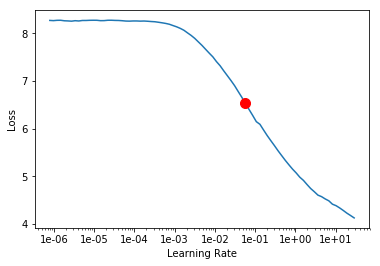

In [0]:
learn4.lr_find(end_lr=100)
learn4.recorder.plot(suggestion=True)

In [0]:
learn4.fit_one_cycle(60, max_lr=1e-1, 
                   callbacks=[SaveModelCallback(learn4, every='epoch', monitor='accuracy', name='mobile-res4')])
#exportStage2(learn4, path)

epoch,train_loss,valid_loss,accuracy,time
0,3.557095,2.421895,0.492063,00:47
1,2.137970,1.118527,0.509259,00:46
2,1.496892,1.035951,0.501323,00:47
3,1.240054,1.060472,0.420635,00:48
4,1.133915,1.003827,0.525132,00:47
5,1.084797,1.051118,0.485450,00:48
6,1.067169,1.075674,0.474868,00:46
7,1.058542,1.055353,0.494709,00:48
8,1.055180,1.082913,0.484127,00:47
9,1.046661,1.012769,0.501323,00:49
